In [1]:
import os 

In [2]:
os.chdir('/data/T9.data/import/P9/Xenium/')

In [3]:
import os
import sys
import matplotlib.pyplot as plt
import nichemap
import numpy as np
import pandas as pd
import scanpy as sc

/root/miniconda3/envs/stlearn/lib/python3.12/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [4]:
adata = sc.read_h5ad("./addcn.cnv.TLS.h5ad")

In [5]:
out_dir = './STout/'

In [6]:
gene_list = "./TLS.marker.csv"

In [7]:
score_id = "TLS_score"
bins = 300
peak_intensity = 1.5
exp_intensity = 1.0

In [8]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [9]:
ecm_genes_list = nichemap.preprocess.calculate_gene_signature_score(
    adata=adata,
    csv_path=gene_list,
    score_id=score_id,
    gene_column="Gene",
)

[Score] TLS_score
Genes in CSV: 83
Valid genes: 16
Stored in adata.obs['TLS_score']


In [10]:
adata

AnnData object with n_obs × n_vars = 679659 × 5000
    obs: 'transcript_counts_x', 'control_probe_counts_x', 'genomic_control_counts_x', 'control_codeword_counts_x', 'unassigned_codeword_counts_x', 'deprecated_codeword_counts_x', 'total_counts_x', 'cell_area_x', 'nucleus_area_x', 'nucleus_count_x', 'segmentation_method_x', 'region_x', 'z_level_x', 'cell_labels_x', 'n_genes_by_counts_x', 'log1p_n_genes_by_counts_x', 'log1p_total_counts_x', 'pct_counts_in_top_10_genes_x', 'pct_counts_in_top_20_genes_x', 'pct_counts_in_top_50_genes_x', 'pct_counts_in_top_150_genes_x', 'n_counts_x', 'log10GenesPerUMI_x', 'leiden_x', 'celltype_x', 'CN', 'transcript_counts_y', 'control_probe_counts_y', 'genomic_control_counts_y', 'control_codeword_counts_y', 'unassigned_codeword_counts_y', 'deprecated_codeword_counts_y', 'total_counts_y', 'cell_area_y', 'nucleus_area_y', 'nucleus_count_y', 'segmentation_method_y', 'region_y', 'z_level_y', 'cell_labels_y', 'n_genes_by_counts_y', 'log1p_n_genes_by_counts_y', '

In [11]:
adata.obs['x_centroid'] = adata.obsm['spatial'][:, 0]  # 
adata.obs['y_centroid'] = adata.obsm['spatial'][:, 1]  # 

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Spatial_TLS_score.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

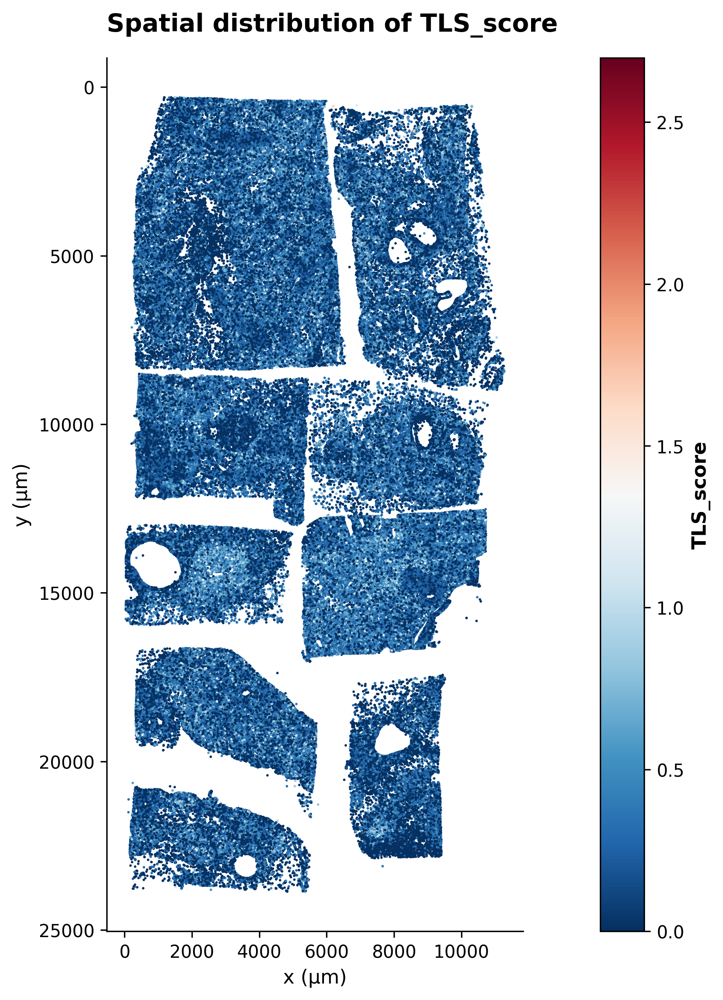

In [12]:
nichemap.plot.plot_spatial_score(
    adata,
    score_name=score_id,
    out_dir=out_dir,
)


In [13]:
sigma_peak = 2

mean_map, smooth_map_peak, counts, xedges, yedges = nichemap.utils.generate_mean_grid_map(
    adata,
    score_id=score_id,
    bins=bins,
    sigma_peak=sigma_peak,
)

[Grid] TLS_score
Shape: (300, 300), Non-empty: 55553


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Figure_1A_Raw_TLS_score_grid_map.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

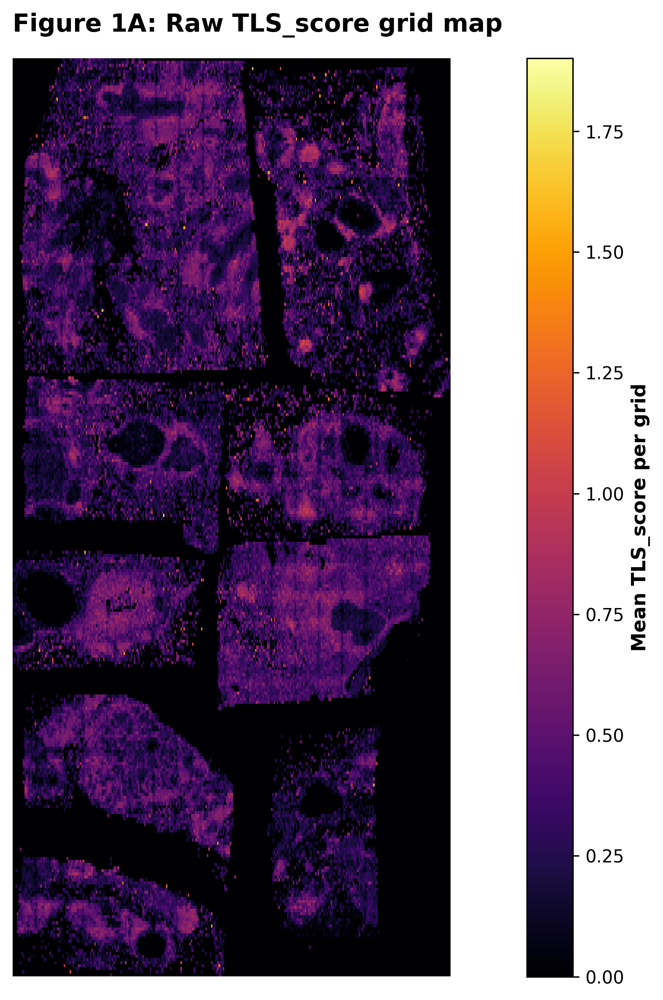

In [14]:
nichemap.plot.plot_grid_map(
    mean_map,
    xedges,
    yedges,
    cmap="inferno",
    title=f"Figure 1A: Raw {score_id} grid map",
    cbar_label=f"Mean {score_id} per grid",
    out_dir=out_dir,
)

In [16]:
nichemap.plot.plot_grid_map

<function nichemap.plot.plot_grid_map(map_data, xedges, yedges, cmap='inferno', title='Step 1A: Raw ECM grid map', cbar_label='Mean ECM score per grid', figsize=(16, 8), out_dir=None)>

In [18]:
nichemap.plot.plot_grid_map

<function nichemap.plot.plot_grid_map(map_data, xedges, yedges, cmap='inferno', title='Step 1A: Raw ECM grid map', cbar_label='Mean ECM score per grid', figsize=(16, 8), out_dir=None)>

In [20]:
import matplotlib.pyplot as plt

fig = nichemap.plot.plot_grid_map(
    counts,
    xedges,
    yedges,
    cmap="viridis",
    title="Grid cell density",
    cbar_label="Cell count per grid",
)


plt.savefig("grid_density.pdf", format='pdf', bbox_inches='tight')
plt.close(fig)  # 

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Grid_cell_density.png


NameError: name 'fig' is not defined

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

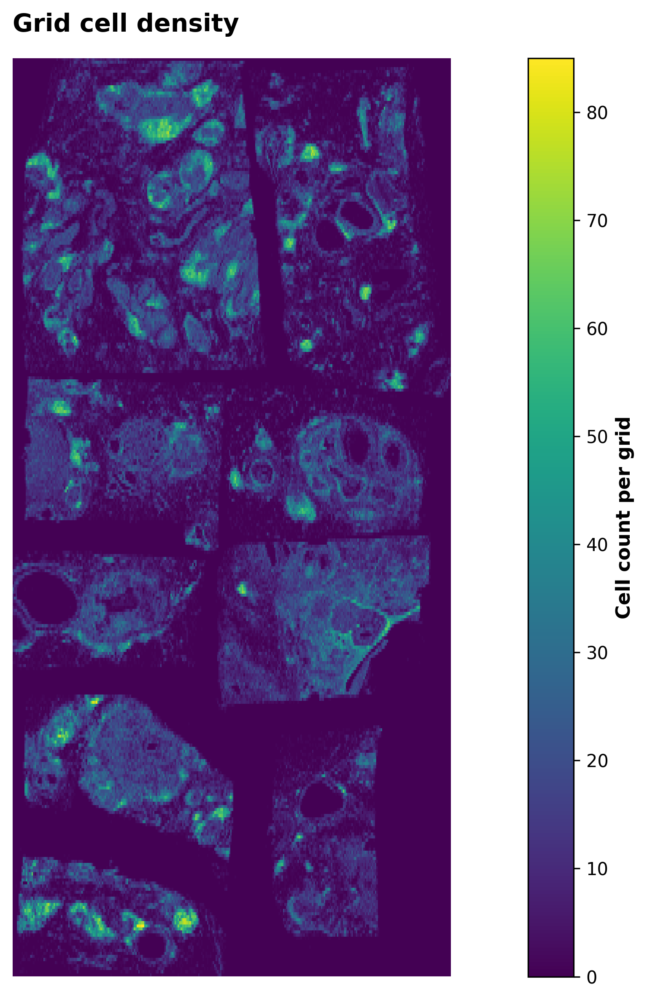

In [17]:
nichemap.plot.plot_grid_map(
    counts,
    xedges,
    yedges,
    cmap="viridis",
    title="Grid cell density",
    cbar_label="Cell count per grid",
    out_dir=out_dir,
)
# fig.savefig("grid_density.pdf", format='pdf', bbox_inches='tight')
# plt.close(fig)  

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Figure_2A_Detected_niche_peaks.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Figure_2B_Peak_positions_on_spatial_map.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

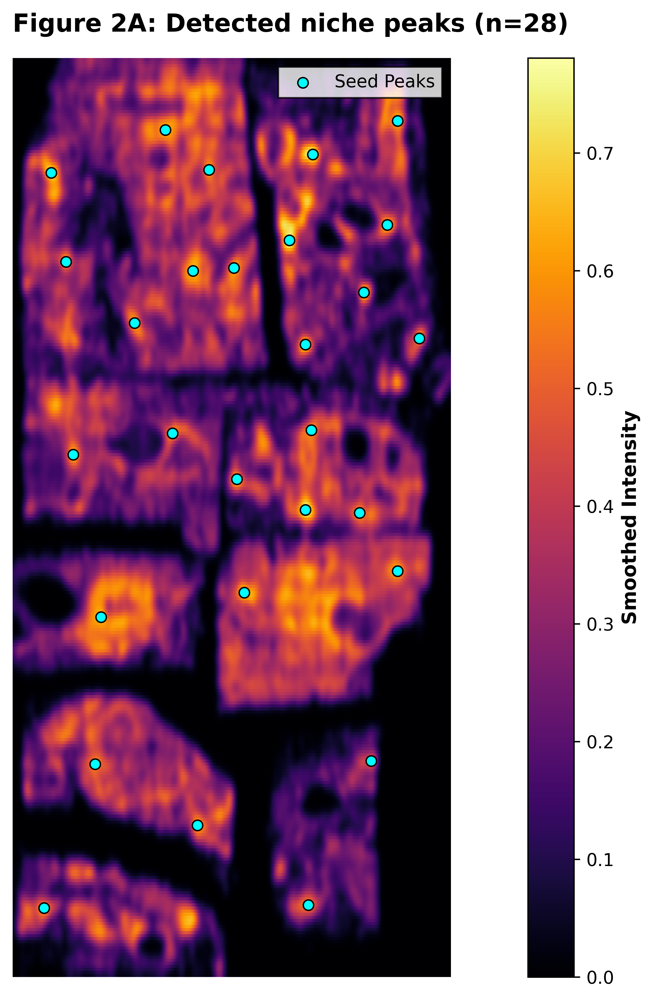

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

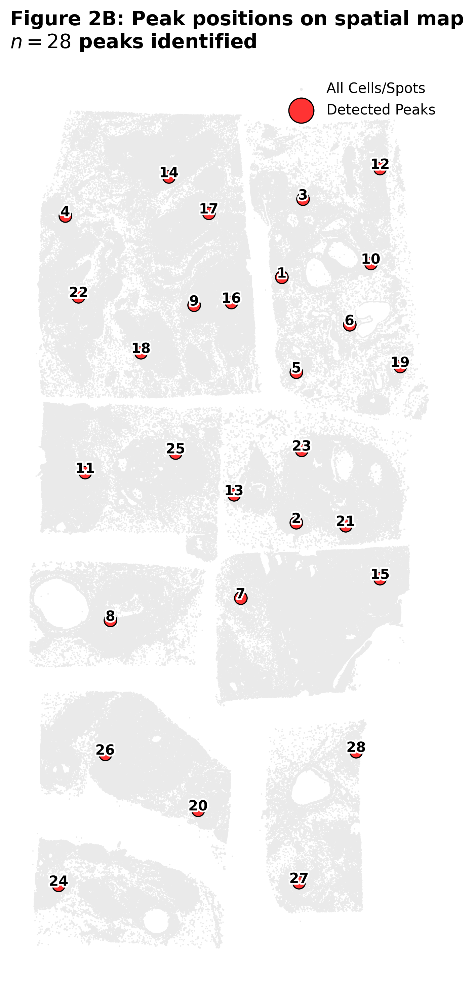

In [18]:
_, _, peak_coords, results_df = nichemap.utils.find_peaks(
    smooth_map_peak,
    mode="heuristic",
    intensity_sigma=peak_intensity,
    use_otsu_base=True,
)

markers, peak_x, peak_y = nichemap.plot.visualize_and_export_peaks(
    smooth_map_peak,
    peak_coords,
    xedges,
    yedges,
    out_dir=out_dir,
)

x = adata.obs["x_centroid"].values
y = adata.obs["y_centroid"].values

peak_x, peak_y = nichemap.plot.plot_peak_positions_on_scatter(
    x_col=x,
    y_col=y,
    peak_coords=peak_coords,
    xedges=xedges,
    yedges=yedges,
    out_dir=out_dir,
)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Figure_3A_Candidate_expansion_region.png
[Watershed] Niche count: 28


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Figure_4A_Spatial_Niche_Segmentation.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

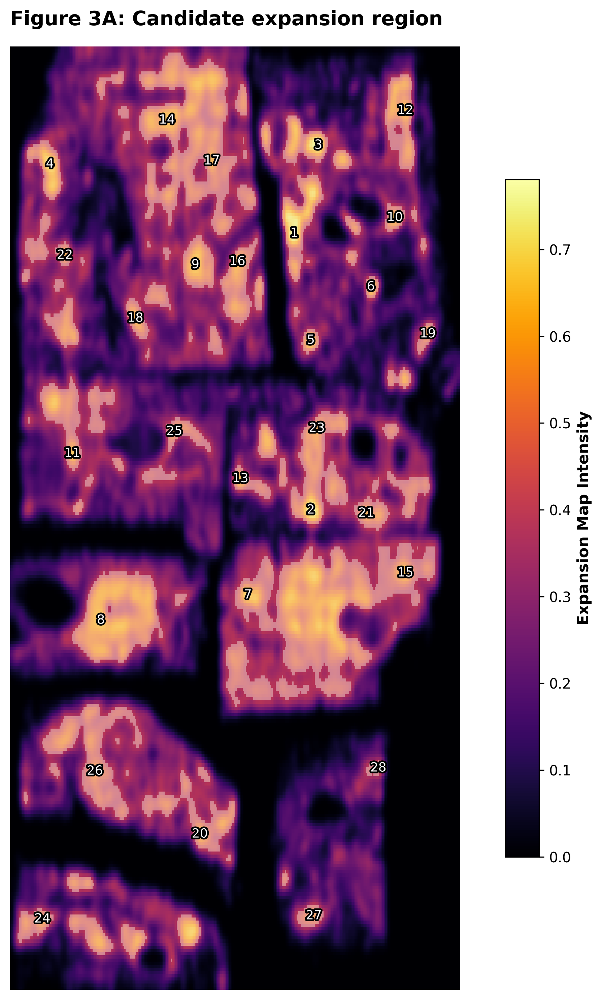

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

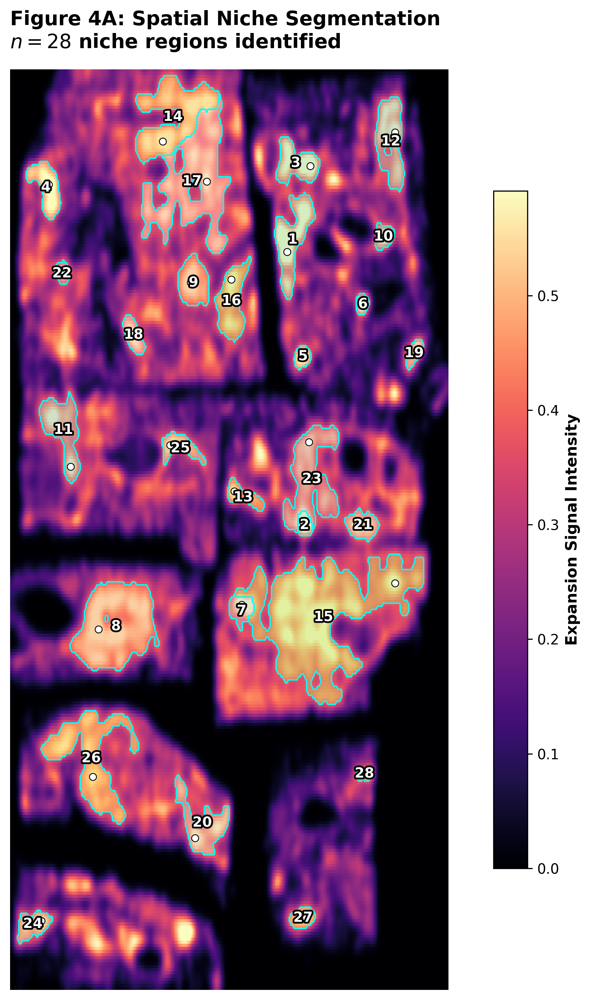

In [19]:
smooth_map_exp, niche_mask = nichemap.utils.create_expansion_mask(
    mean_map,
    sigma=2,
    mode="heuristic",
    expansion_sigma=exp_intensity,
    use_otsu_base=True,
)

nichemap.plot.plot_expansion_mask(
    smooth_map_exp,
    niche_mask,
    peak_x,
    peak_y,
    xedges,
    yedges,
    out_dir=out_dir,
)

niche_labels, niche_ids = nichemap.utils.segment_niche_regions(
    smooth_map_exp,
    markers,
    niche_mask,
)

nichemap.plot.plot_niche_map(
    smooth_map_exp,
    niche_labels,
    peak_x,
    peak_y,
    xedges,
    yedges,
    cmap_base="magma",
    cmap_labels="Set3",
    out_dir=out_dir,
)

[Assign] TLS_score_niche_id
TLS_score_niche_id
0     425900
15     48200
17     25510
14     24156
26     21099
Name: count, dtype: int64


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Computing vector boundaries for niche sketching...
Computing niche centroids for in situ labeling...


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

Figure saved to ./STout/Figure_4B_Cell-level_niche_assignment.png


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

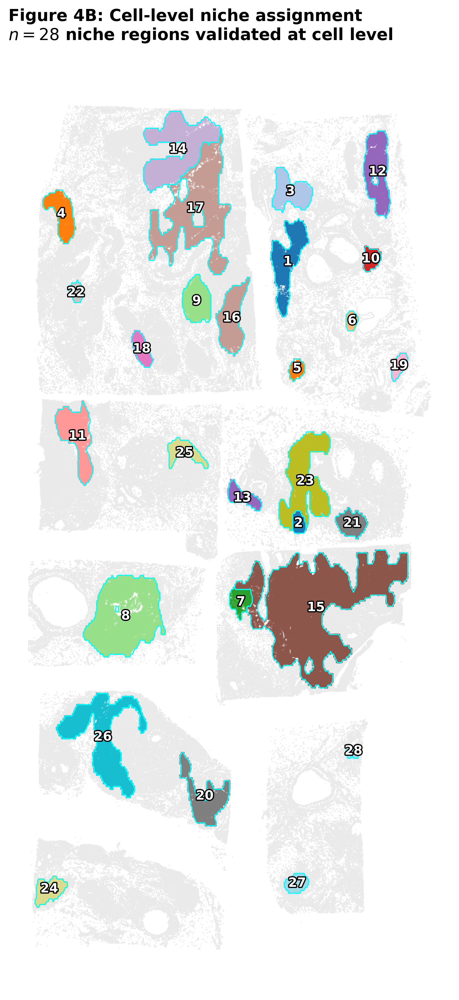

In [20]:
nichemap.utils.map_niche_to_cells(
    adata,
    niche_labels,
    xedges,
    yedges,
    x_col="x_centroid",
    y_col="y_centroid",
    output_col=f"{score_id}_niche_id",
    verbose=True,
)

nichemap.plot.plot_cell_level_niches(
    adata,
    niche_labels,
    xedges,
    yedges,
    niche_column=f"{score_id}_niche_id",
    coords_columns=("x_centroid", "y_centroid"),
    s_bg=1,
    s_fg=3,
    cmap="tab20",
    boundary_color="cyan",
    out_dir=out_dir,
    verbose=True,
)

In [21]:
nichemap.utils.export_niche_results(
    adata=adata,
    out_dir=out_dir,
    niche_column=f"{score_id}_niche_id",
    file_prefix="SSc_1_1_2",
    export_csv=True,
    export_h5ad=True,
)

[Export] Assigned: 253759/679659
